In [1]:
import mne
import numpy as np
import scipy
import os
from scipy import signal as sg
from matplotlib import pyplot as plt

# Load Data

In [2]:
directory_path = "D:/EEG RESEARCH DATA"
os.chdir(directory_path)

In [11]:
# fpath = 'epoch_data'
fpath = 'hep_asr'
# fpath = 'hep_ica_all'

epoch_stress = []
for i in os.listdir(fpath):
    if i.endswith('-stress-epo.fif'):
        epoch_stress.append(os.path.join(fpath,i))

epoch_first_rest = []
for i in os.listdir(fpath):
    if i.endswith('-first-epo.fif'):
        epoch_first_rest.append(os.path.join(fpath,i))

In [12]:
epochs_stress_list =[mne.read_epochs(file) for file in epoch_stress]

epochs_first_rest_list =[mne.read_epochs(file) for file in epoch_first_rest]

Reading D:\EEG RESEARCH DATA\hep_asr\20231019_B68_stroop5mins_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
323 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240129_B71_mat5mins_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
69 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240418_B98_jikken_0001-asr-stress-epo.fif ...
    Found the data of interest:
        t =    -200.00 ...     600.00 ms
        0 CTF compensation matrices available
Not setting metadata
269 matching events found
No baseline correction applied
0 projection items activated
Reading D:\EEG RESEARCH DATA\hep_asr\20240418_B98_jikken_0002

# All Epoch Check

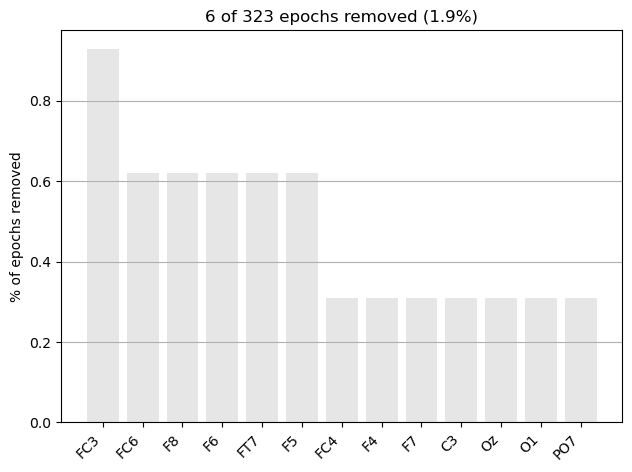

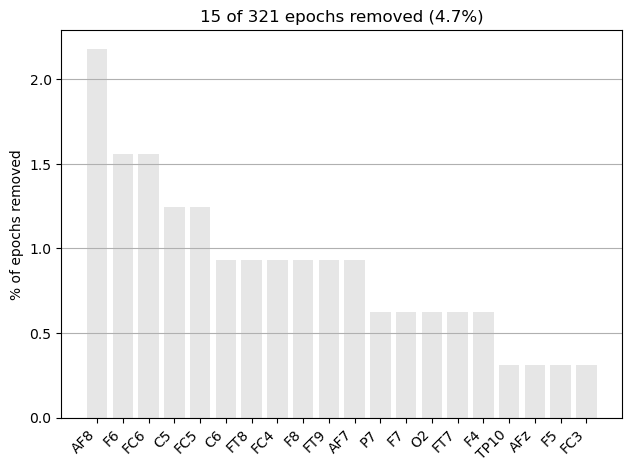

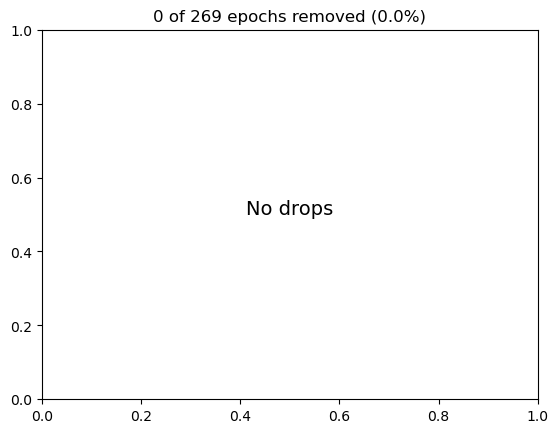

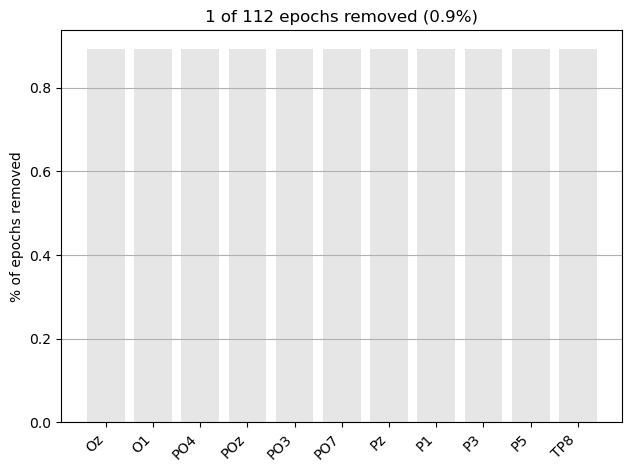

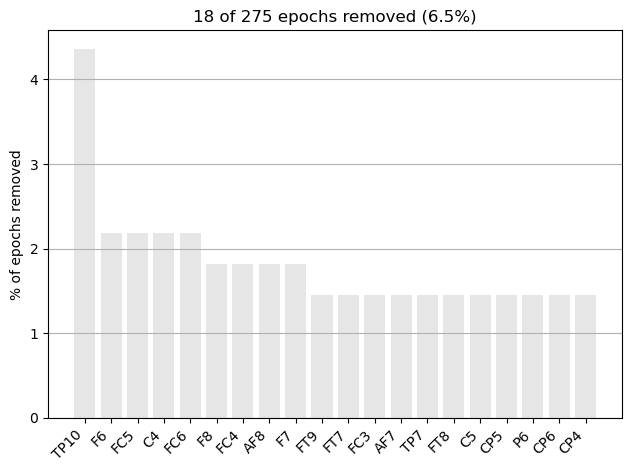

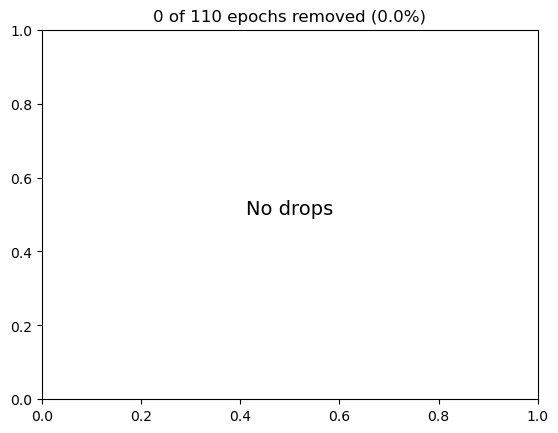

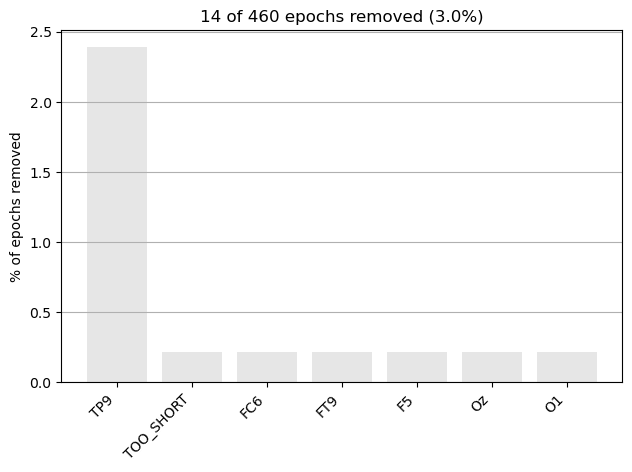

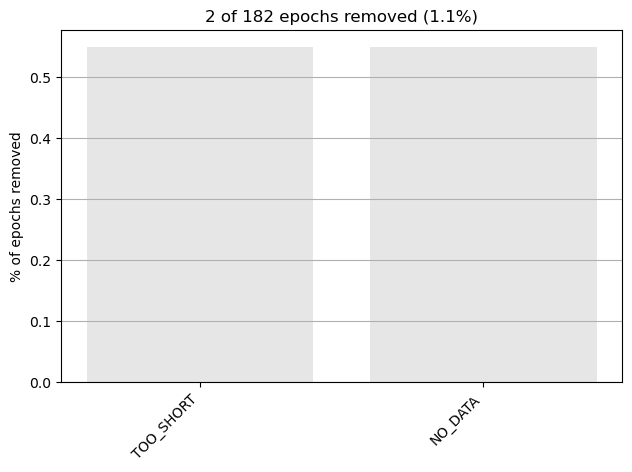

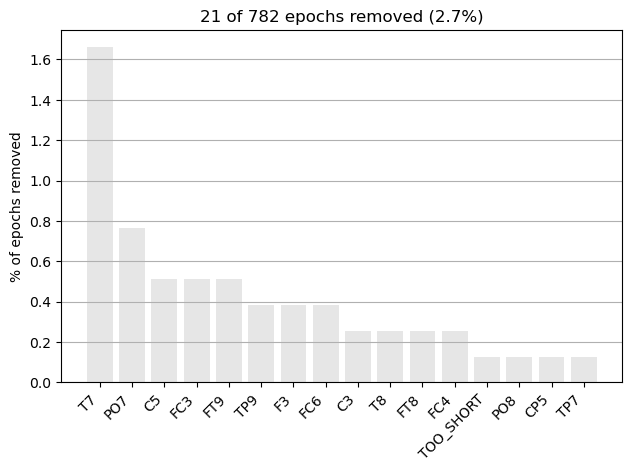

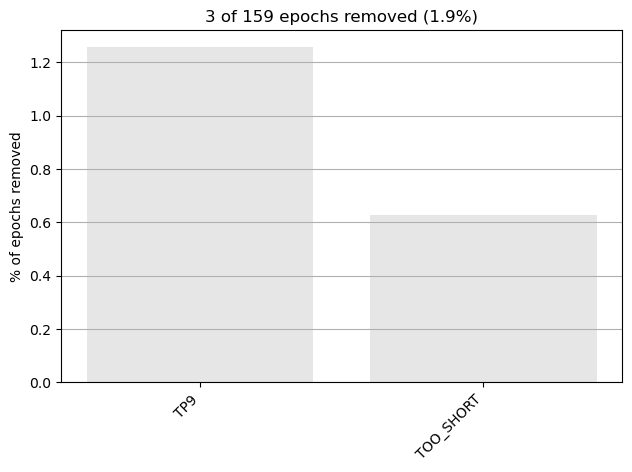

In [42]:
for i in epochs_stress_list:
    i.plot_drop_log()

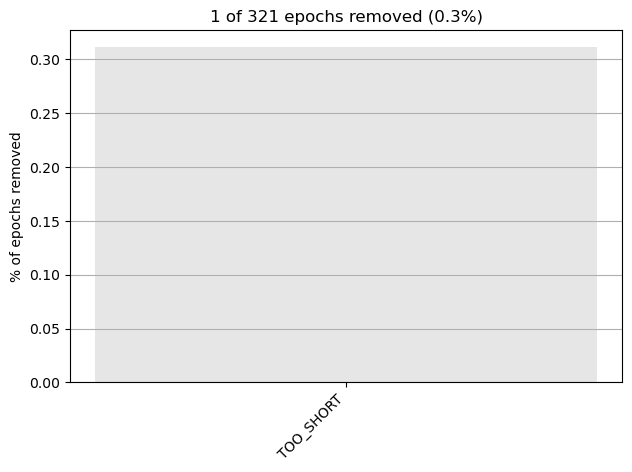

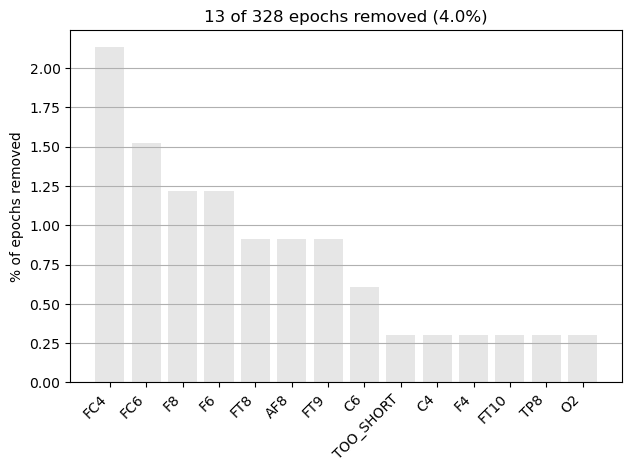

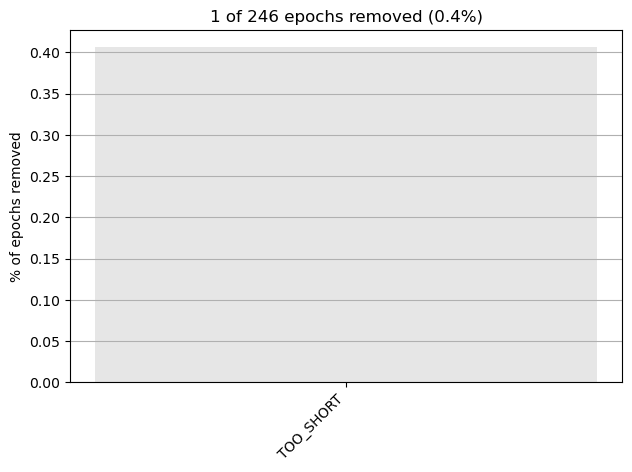

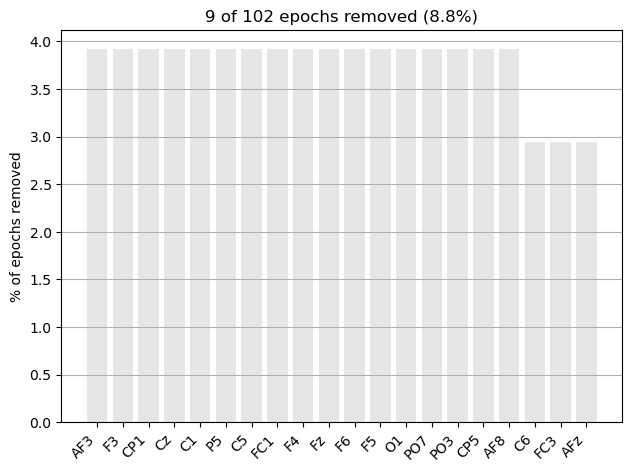

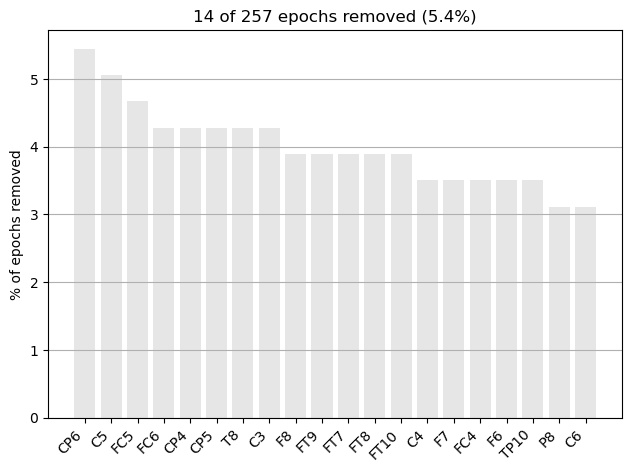

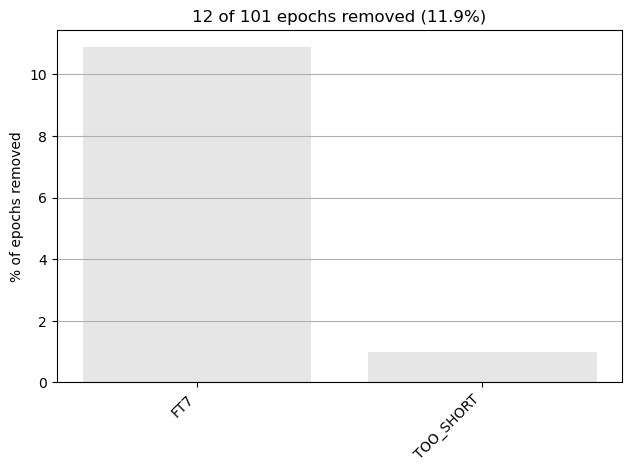

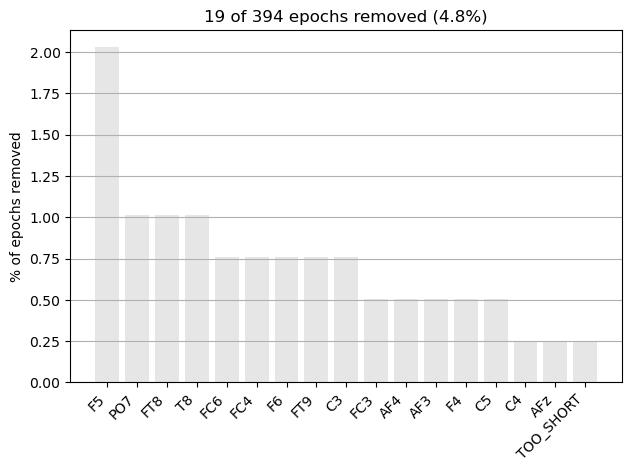

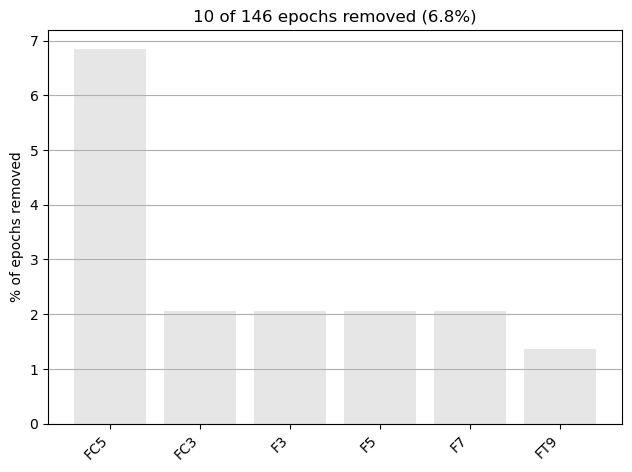

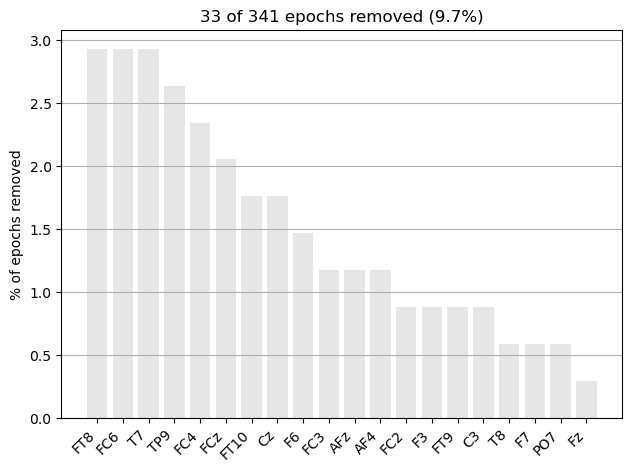

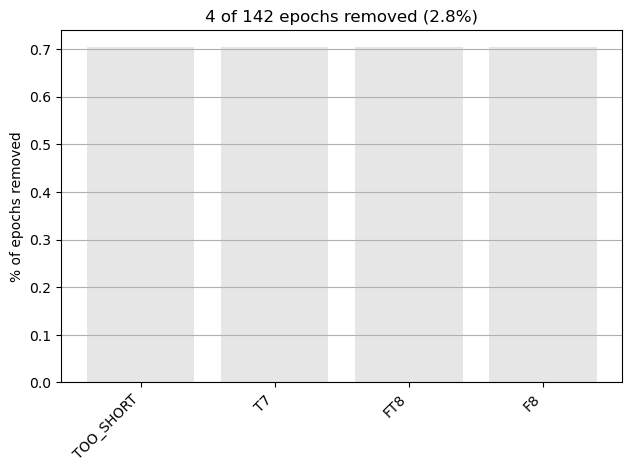

In [41]:
for i in epochs_first_rest_list:
    i.plot_drop_log()

In [60]:
evoked_stress = [epo.average() for epo in epochs_stress_list]
evoked_first_rest = [epo.average() for epo in epochs_first_rest_list]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy functi

Identifying common channels ...
Identifying common channels ...


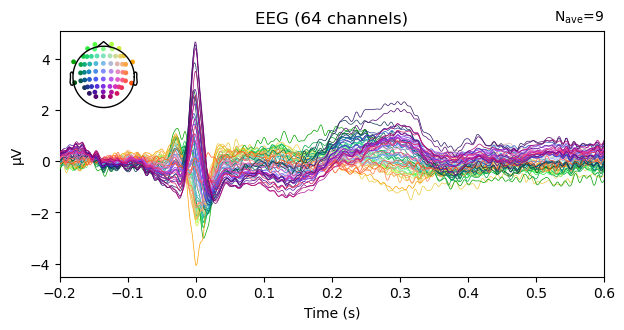

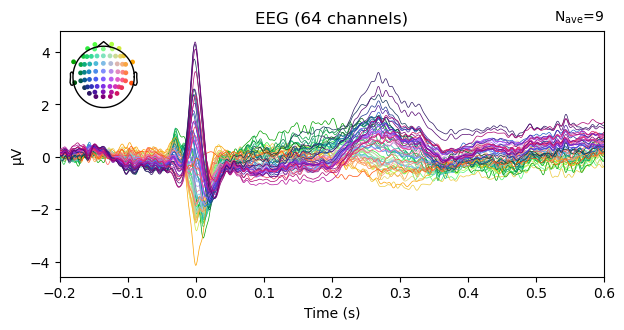

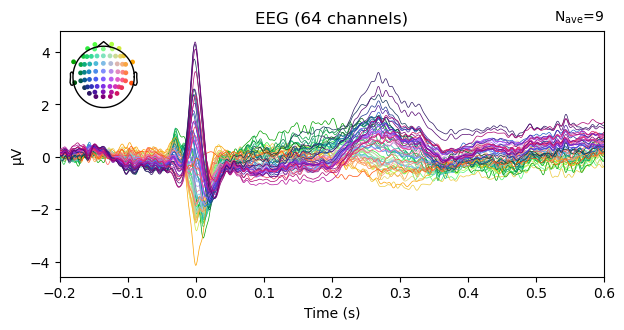

In [46]:
stress_grand_average = mne.grand_average(evoked_stress)
rest_grand_average = mne.grand_average(evoked_first_rest)

stress_grand_average.plot()
rest_grand_average.plot()

In [47]:
concatenate_stress = mne.concatenate_epochs(epochs_stress_list)
concatenate_rest = mne.concatenate_epochs(epochs_first_rest_list)

C:\Users\jeje_\AppData\Local\Temp\ipykernel_6676\1413174694.py:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_stress = mne.concatenate_epochs(epochs_stress_list)


Not setting metadata
2607 matching events found
Applying baseline correction (mode: mean)
Not setting metadata


C:\Users\jeje_\AppData\Local\Temp\ipykernel_6676\1413174694.py:2: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  concatenate_rest = mne.concatenate_epochs(epochs_first_rest_list)


1947 matching events found
Applying baseline correction (mode: mean)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


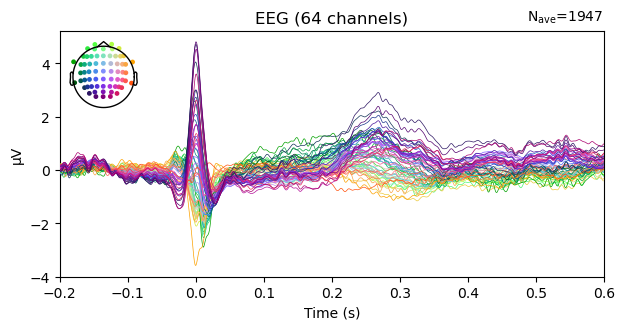

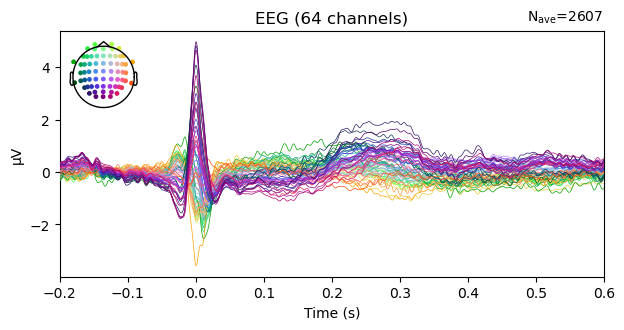

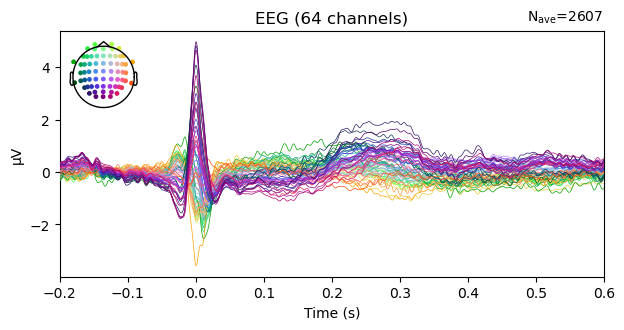

In [48]:
evoked_first_rest1 = concatenate_rest.average()
evoked_stress1 = concatenate_stress.average()

evoked_first_rest1.plot()
evoked_stress1.plot()

In [49]:
concatenate_rest_data = concatenate_rest.get_data()
concatenate_stress_data = concatenate_stress.get_data()

## T-Test

In [50]:
from scipy.stats import ttest_ind

t_test_ga = ttest_ind(concatenate_rest_data,concatenate_stress_data)

In [ ]:
#To plot the grand averaged Data, while the P value is taken from the group of concatenated epoch
stress_grand_average_data = stress_grand_average.get_data()
rest_grand_average_data = rest_grand_average.get_data()


In [30]:
np.shape(t_test_ga.pvalue)

(64, 801)

## T-Test Plot

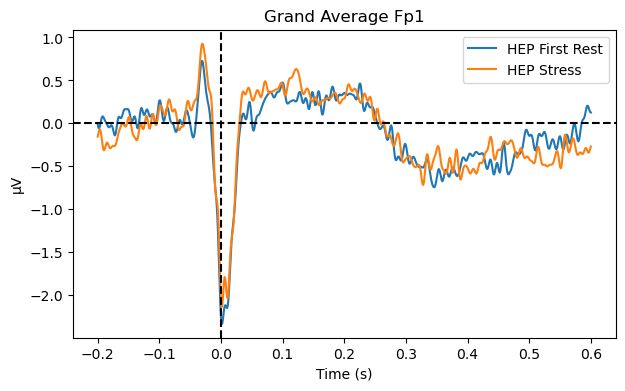

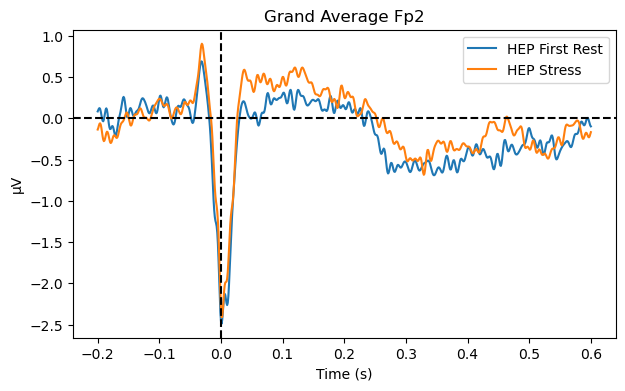

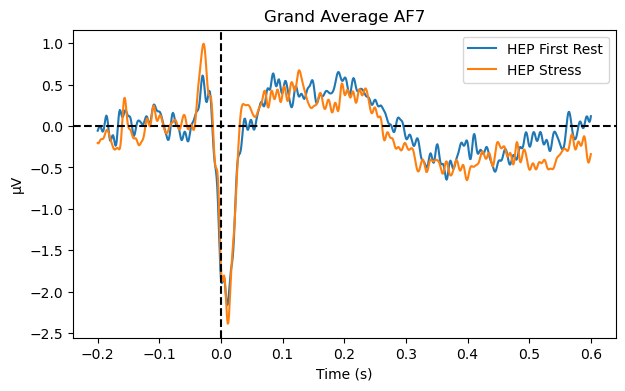

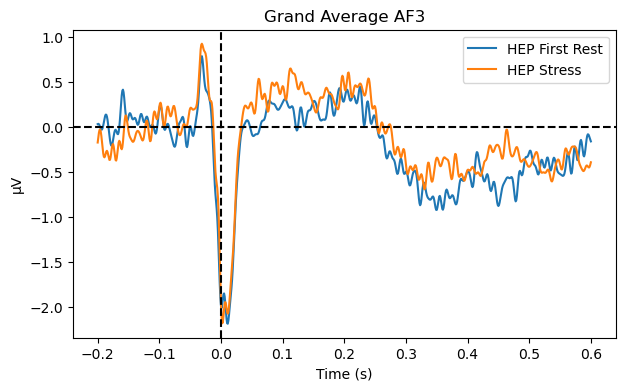

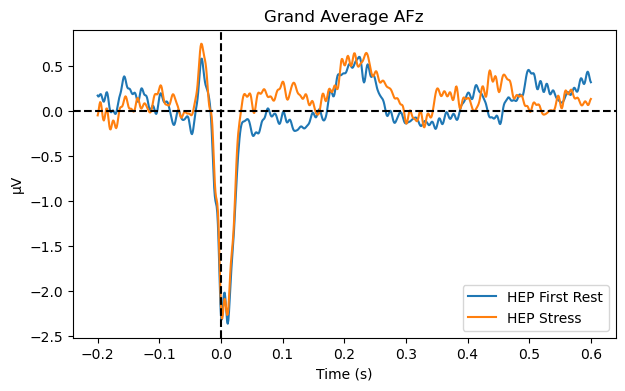

...

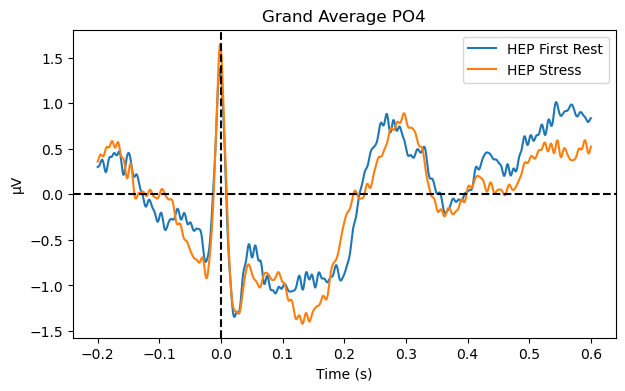

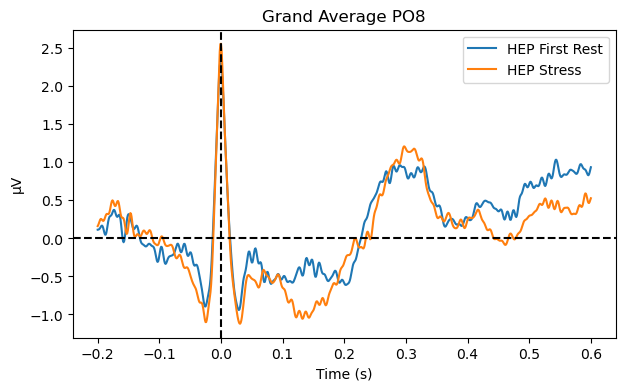

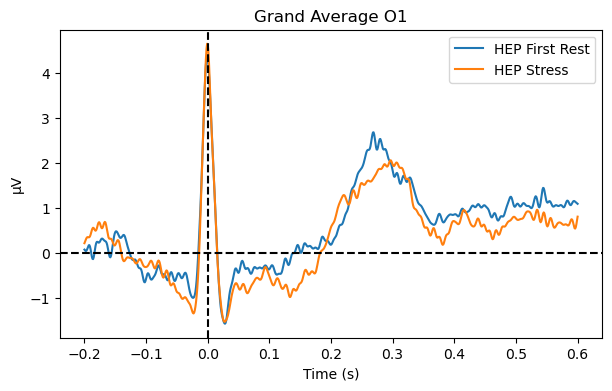

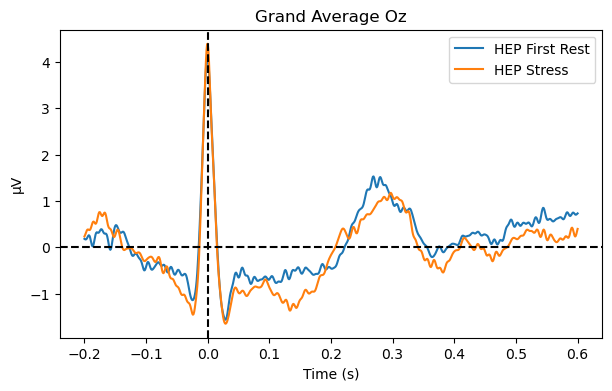

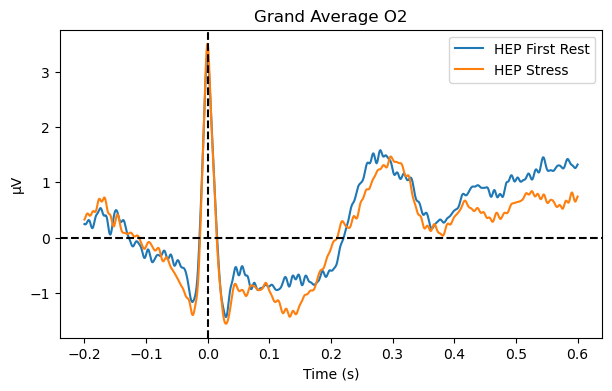

In [52]:
ch_name = stress_grand_average.ch_names
diff = rest_grand_average_data - stress_grand_average_data
step = 1/1000
epoch_tmin = -0.2
epoch_tmax = 0.6
time = np.arange(epoch_tmin, epoch_tmax+step, step)

for j in range(len(ch_name)):
    a = ch_name[j]

    plt.figure(figsize= (7,4))
    plt.plot(time,rest_grand_average_data[j] * 1e6, label = 'HEP First Rest')
    plt.plot(time,stress_grand_average_data[j]* 1e6, label = 'HEP Stress')
    # plt.plot(time,diff[j]* 1e6, label = 'HEP Diference')
    # for i in range(len(t_test_ga.pvalue[j])):
    #     if t_test_ga.pvalue[j][i] <= 0.01:
    #         plt.axvline(x = (i*step)+epoch_tmin, ymin = 0 , ymax = 1, alpha = 0.3)
    plt.axvline(0, linestyle = '--', c = 'black')
    plt.axhline(0, linestyle = '--', c = 'black')
    plt.ylabel('μV')
    plt.xlabel('Time (s)')
    plt.legend()
    plt.title('Grand Average '+ a)
    plt.show()

# Individual Epoch Check

In [13]:
epochs_stress_list

[<EpochsFIF |  323 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~126.4 MB, data loaded,
  '7': 323>,
 <EpochsFIF |  69 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~27.1 MB, data loaded,
  '7': 69>,
 <EpochsFIF |  269 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~105.3 MB, data loaded,
  '7': 269>,
 <EpochsFIF |  112 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~43.9 MB, data loaded,
  '7': 112>,
 <EpochsFIF |  266 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~104.1 MB, data loaded,
  '7': 266>,
 <EpochsFIF |  109 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~42.7 MB, data loaded,
  '7': 109>,
 <EpochsFIF |  447 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~174.9 MB, data loaded,
  '7': 447>,
 <EpochsFIF |  176 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~68.9 MB, data loaded,
  '7': 176>,
 <EpochsFIF |  760 events (all good), -0.2 – 0.6 s, baseline -0.2 – 0 s, ~297.3 MB, data loaded,
  '7': 760>,
 <EpochsFIF |  1

In [14]:
def check_epoch(file_num):
    return(epochs_first_rest_list[file_num], epochs_stress_list[file_num])

## Plot Compared Evoked

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Done 19601 tasks      | elapsed:    3.4s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


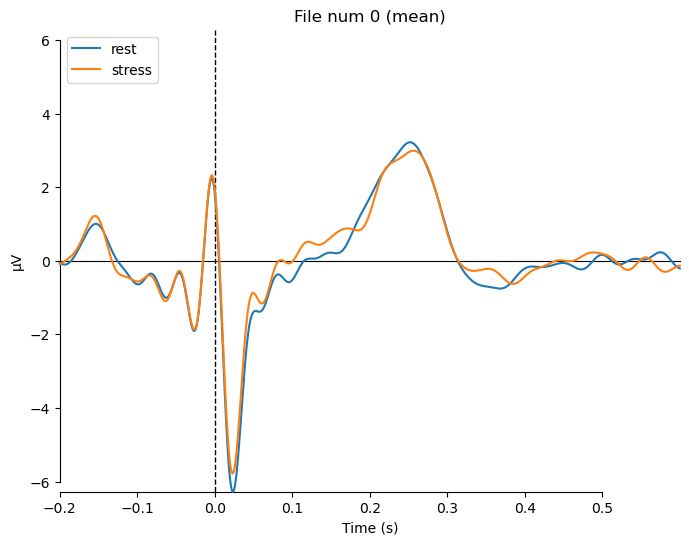

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


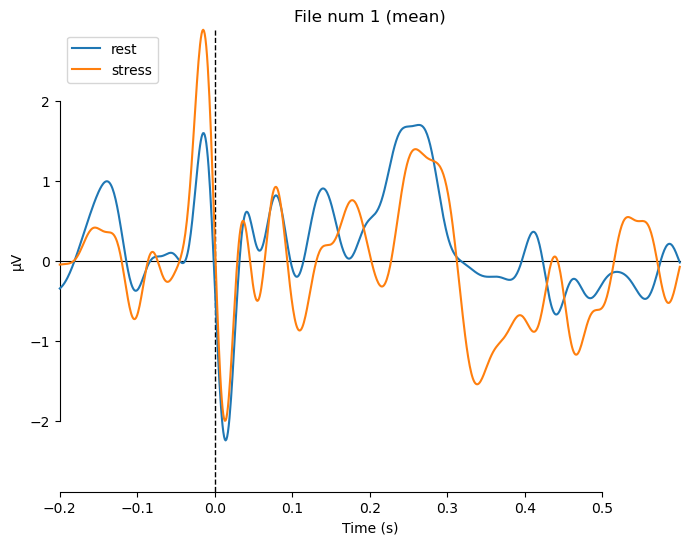

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


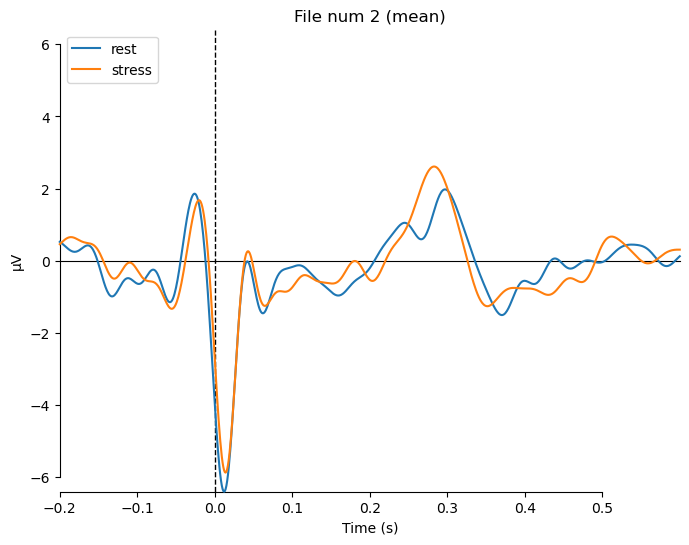

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 5831 tasks      | elapsed:    0.9s
C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


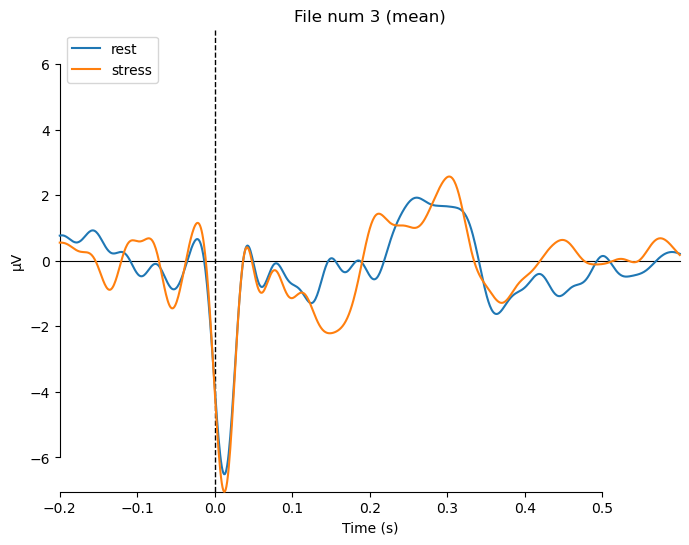

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 16199 tasks      | elapsed:    2.7s
C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Pa

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


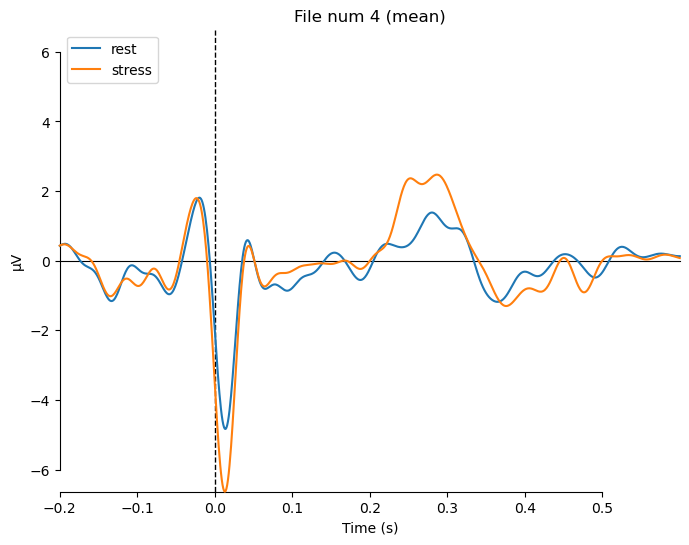

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 5831 tasks      | elapsed:    0.9s
C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


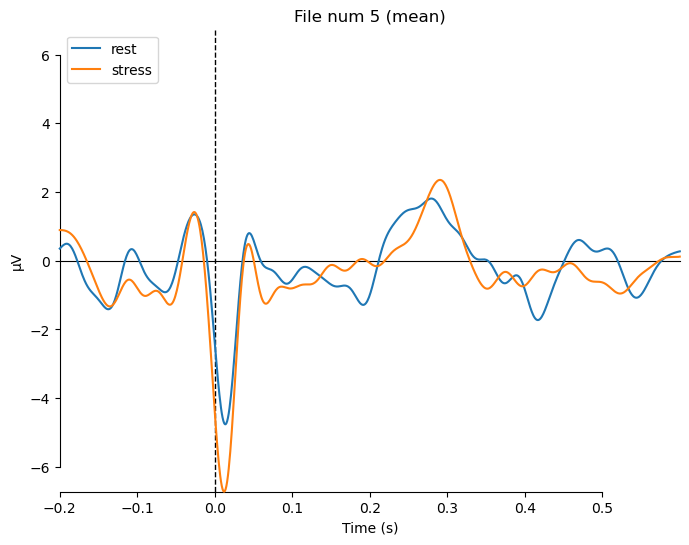

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Done 23327 tasks      | elapsed:    4.0s


Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


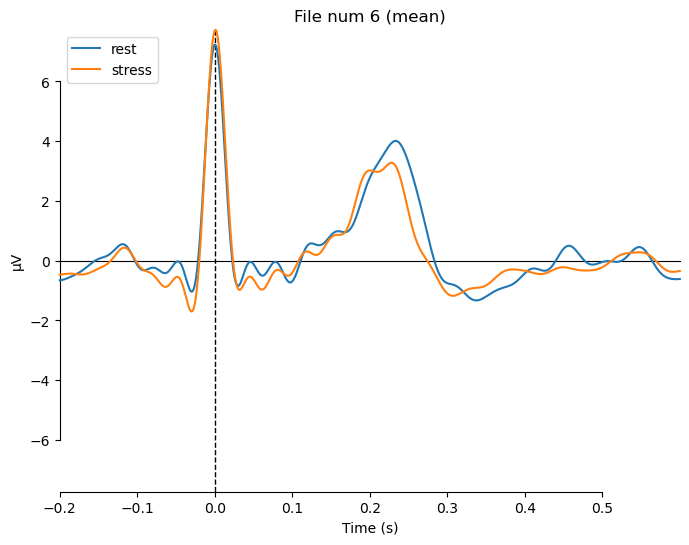

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"


[Parallel(n_jobs=1)]: Done 10367 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done 11249 tasks      | elapsed:    1.8s


combining channels using "mean"


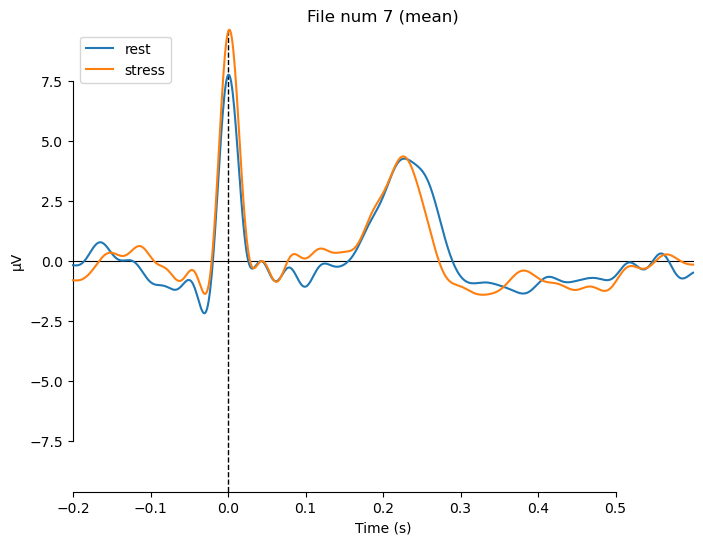

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.3s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 20807 tasks      | elapsed:    3.5s
C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Pa

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


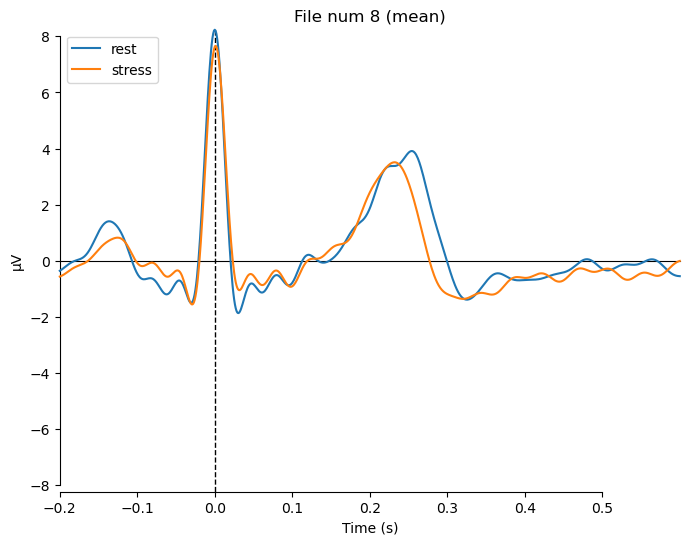

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:3: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_evoked = rest_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 8711 tasks      | elapsed:    1.4s
C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\3293704470.py:4: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_evoked = stress_epo.filter(1,25).average()
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Par

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


[Parallel(n_jobs=1)]: Done 9521 tasks      | elapsed:    1.5s


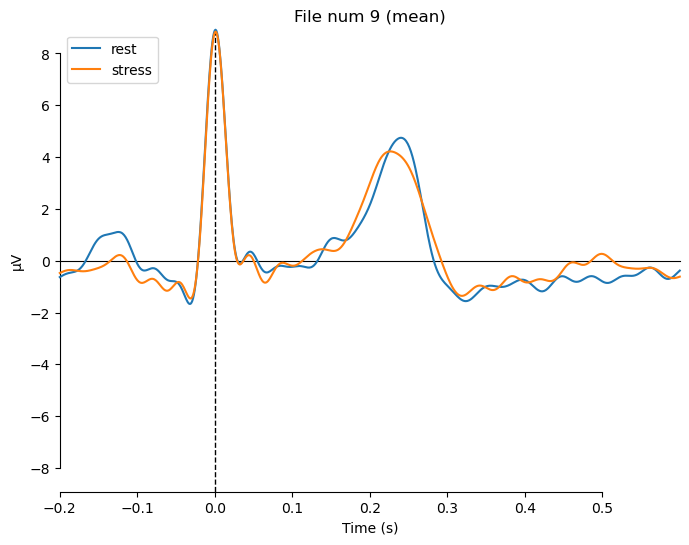

In [15]:
for i in range(len(epochs_first_rest_list)):
    rest_epo,stress_epo = check_epoch(i)
    rest_evoked = rest_epo.filter(1,25).average()
    stress_evoked = stress_epo.filter(1,25).average()

    evokdes = dict(rest = rest_evoked , stress = stress_evoked)
    mne.viz.plot_compare_evokeds(evokdes, combine='mean',title = f'File num {i}')

## T-Test Individual Epoch

In [8]:
file_num = 2
rest_epo, stress_epo = check_epoch(file_num)

In [ ]:
rest_epo30 = rest_epo.copy().filter(1,25)
stress_epo30 = stress_epo.copy().filter(1,25)

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\1200742452.py:1: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  rest_epo30 = rest_epo.copy().filter(1,25)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Parallel(n_

Setting up band-pass filter from 1 - 25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 25.00 Hz
- Upper transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 28.12 Hz)
- Filter length: 3301 samples (3.301 s)



C:\Users\jeje_\AppData\Local\Temp\ipykernel_23140\1200742452.py:2: RuntimeWarning: filter_length (3301) is longer than the signal (801), distortion is likely. Reduce filter length or filter a longer signal.
  stress_epo30 = stress_epo.copy().filter(1,25)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 2591 tasks      | elapsed:    0.4s
[Paralle

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


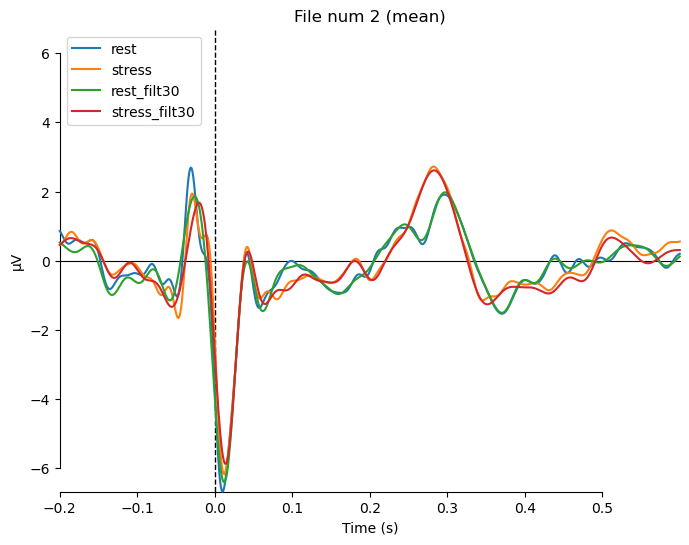

[<Figure size 800x600 with 1 Axes>]

In [38]:
rest_evoked = rest_epo.average()
stress_evoked = stress_epo.average()
rest_evoked30 = rest_epo30.average()
stress_evoked30 = stress_epo30.average()


evokdes = dict(rest = rest_evoked , stress = stress_evoked, rest_filt30 = rest_evoked30, stress_filt30 = stress_evoked30)
mne.viz.plot_compare_evokeds(evokdes, combine='mean',title = f'File num {file_num}')

In [32]:
rest_data = rest_epo.get_data()
stress_data = stress_epo.get_data()

rest_data30 = rest_epo30.get_data()
stress_data_30 = stress_epo30.get_data()

In [33]:
from scipy.stats import ttest_ind

t_test_data = ttest_ind(rest_data,stress_data)
t_test_data30 = ttest_ind(rest_data30,stress_data_30)

In [17]:
print(t_test_data.pvalue)

[[0.6106076  0.63516992 0.67782278 ... 0.03037889 0.03139654 0.03409805]
 [0.94569033 0.96444694 0.97836658 ... 0.32338618 0.35582267 0.38715032]
 [0.86909424 0.96200785 0.93942122 ... 0.09487885 0.09520412 0.10017635]
 ...
 [0.74167635 0.69913548 0.66441079 ... 0.12094264 0.12733702 0.13127711]
 [0.80005276 0.81016203 0.81803376 ... 0.55967449 0.57646837 0.58692238]
 [0.79630053 0.76611682 0.74100131 ... 0.0368044  0.03821259 0.03868187]]


## T-test Plot

In [34]:
rest_avg = rest_epo.average().get_data()
stress_avg = stress_epo.average().get_data()

rest_avg30 = rest_epo30.average().get_data()
stress_avg30 = stress_epo30.average().get_data()

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


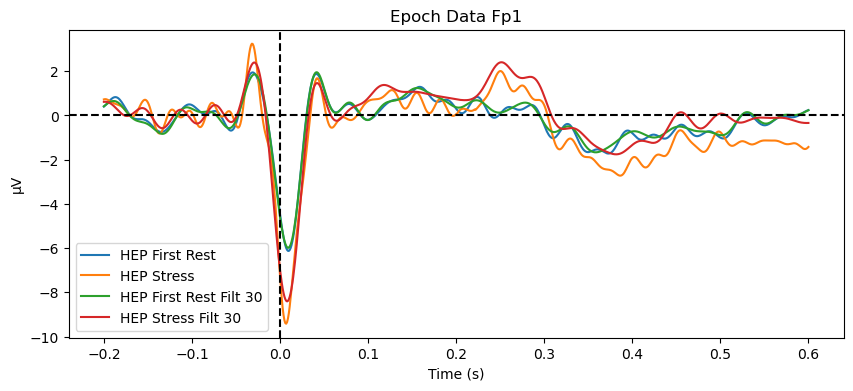

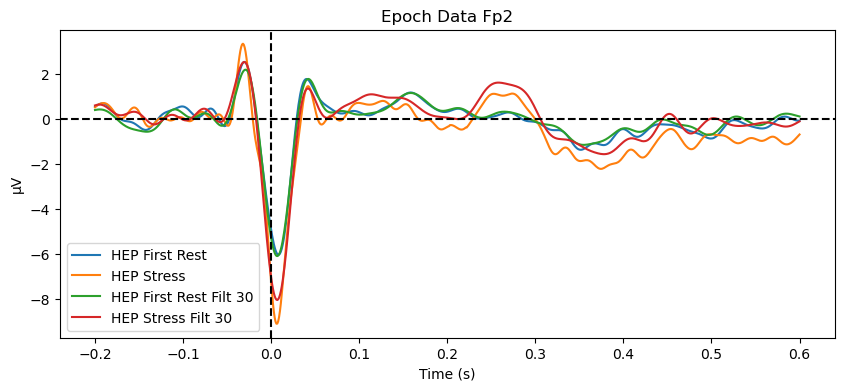

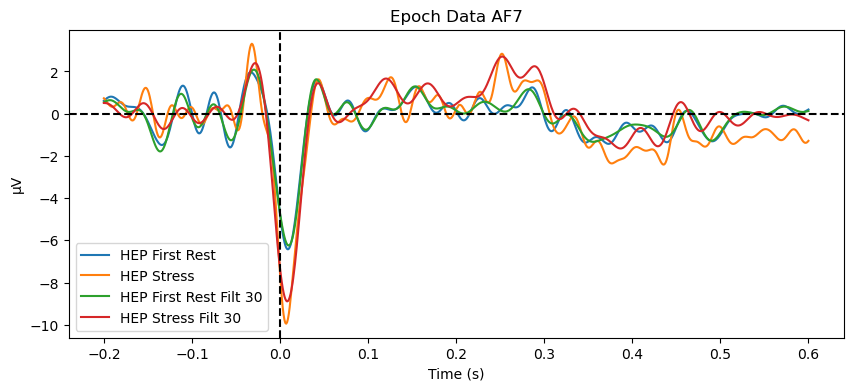

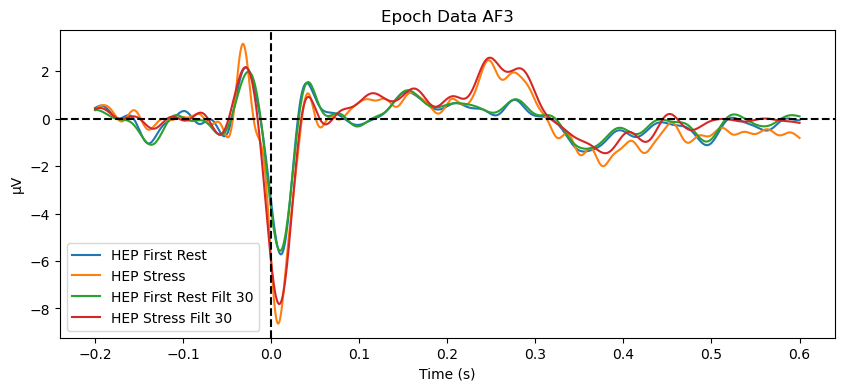

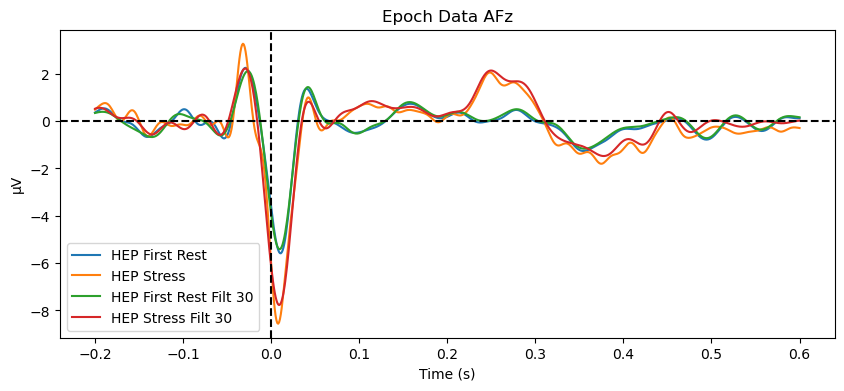

...

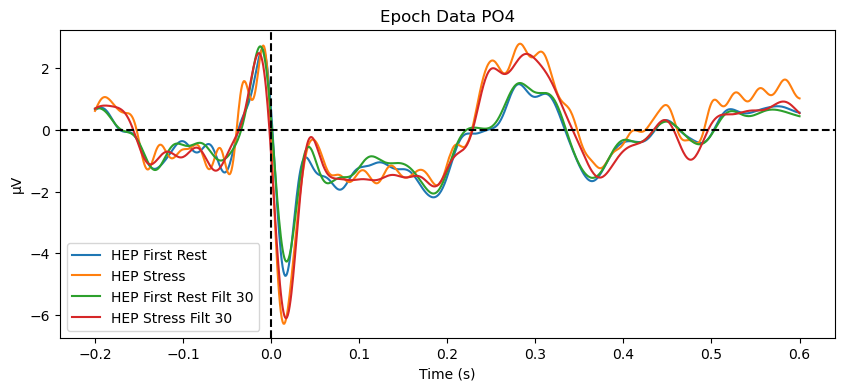

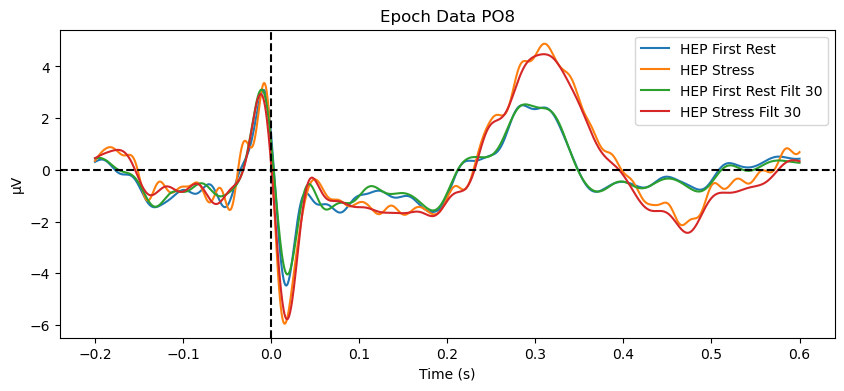

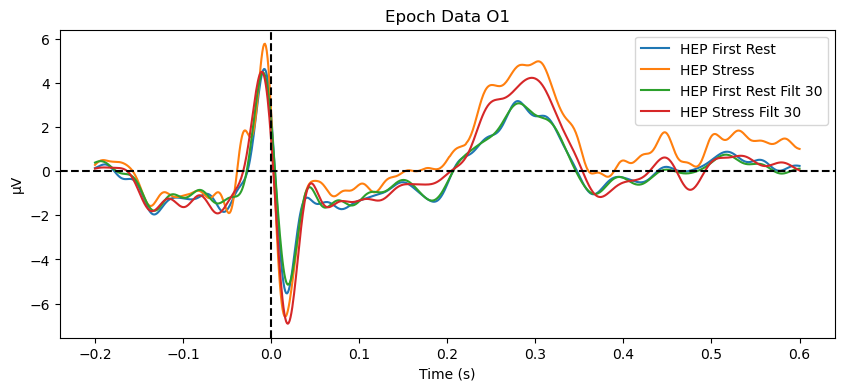

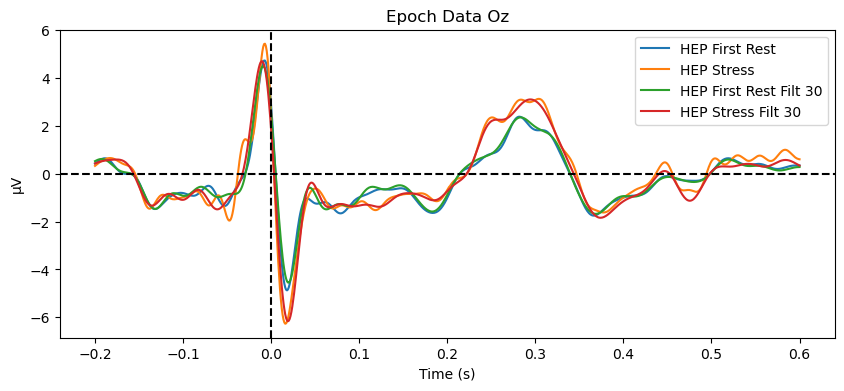

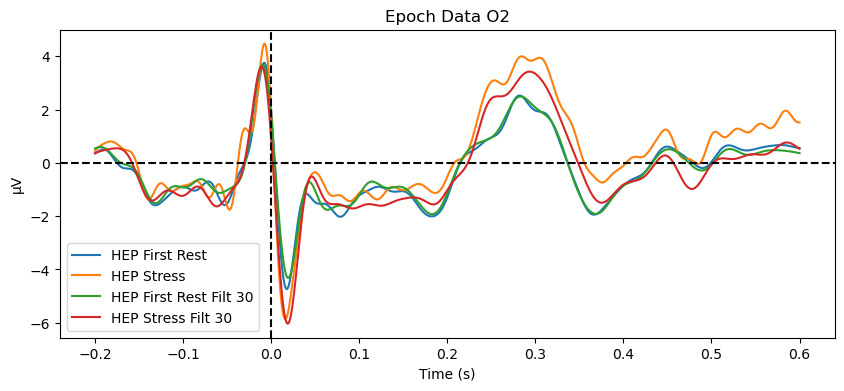

In [35]:
ch_name = rest_epo.ch_names
diff = stress_avg - rest_avg
step = 1/1000
epoch_tmin = -0.2
epoch_tmax = 0.6
time = np.arange(epoch_tmin, epoch_tmax+step, step)

for j in range(len(ch_name)):
    a = ch_name[j]

    plt.figure(figsize= (10,4))
    plt.plot(time,rest_avg[j] * 1e6, label = 'HEP First Rest')
    plt.plot(time,stress_avg[j]* 1e6, label = 'HEP Stress')
    
    plt.plot(time,rest_avg30[j] * 1e6, label = 'HEP First Rest Filt 30')
    plt.plot(time,stress_avg30[j]* 1e6, label = 'HEP Stress Filt 30')
    
    # plt.plot(time,diff[j]* 1e6, label = 'HEP Diference_dropped')
    # for i in range(len(t_test_data.pvalue[j])):
    #     if t_test_data.pvalue[j][i] <= 0.01:
    #         plt.axvline(x = (i*step)+epoch_tmin, ymin = 0 , ymax = 1, alpha = 0.3)
    plt.axvline(0, linestyle = '--', c = 'black')
    plt.axhline(0, linestyle = '--', c = 'black')
    plt.ylabel('μV')
    plt.xlabel('Time (s)')
    plt.legend()
    plt.title('Epoch Data '+ a)
    plt.show()

# Other

In [46]:
index = np.where(t_test_ga.pvalue[ch_name.index('FCz')] <= 0.05) 
index = np.array(index)
for i in range(len(index)):
    index[i] -= 200
print(index)

time_stamp = index*step
print(time_stamp)

print(t_test_ga.pvalue[ch_name.index('FCz')][np.where(t_test_ga.pvalue[ch_name.index('FCz')] <= 0.05)])

[[171 172 173 174 175 214 215 216 217 218 219 220 221 222 223 224 225 226
  227 228 229 230 231 232 233 234 235 236 268 269 270 271 272 273 274 275
  276 277 278 279 280 281 282 283 284 285 286 287 288 289 290 291 292 293
  294 295 296 297 298 299 300 301 302 303 304 305 306 307 308 309 310 311
  312 313]]
[[0.171 0.172 0.173 0.174 0.175 0.214 0.215 0.216 0.217 0.218 0.219 0.22
  0.221 0.222 0.223 0.224 0.225 0.226 0.227 0.228 0.229 0.23  0.231 0.232
  0.233 0.234 0.235 0.236 0.268 0.269 0.27  0.271 0.272 0.273 0.274 0.275
  0.276 0.277 0.278 0.279 0.28  0.281 0.282 0.283 0.284 0.285 0.286 0.287
  0.288 0.289 0.29  0.291 0.292 0.293 0.294 0.295 0.296 0.297 0.298 0.299
  0.3   0.301 0.302 0.303 0.304 0.305 0.306 0.307 0.308 0.309 0.31  0.311
  0.312 0.313]]
[4.85295659e-02 3.97184710e-02 3.58168637e-02 3.61159274e-02
 4.09314760e-02 4.74076472e-02 4.23984203e-02 3.96342979e-02
 3.85762722e-02 3.88094880e-02 3.99756605e-02 4.17204337e-02
 4.36681622e-02 4.54296853e-02 4.66438416e-02 4.70

In [49]:
print(t_test_ga.pvalue[ch_name.index('FCz')][468:513])

[3.22410910e-02 1.70621279e-02 8.50234870e-03 4.06810902e-03
 1.91832877e-03 9.19534298e-04 4.62975777e-04 2.52537807e-04
 1.53079118e-04 1.04881193e-04 8.18056237e-05 7.24742455e-05
 7.21842860e-05 7.95325796e-05 9.50213251e-05 1.20423892e-04
 1.58307974e-04 2.11281755e-04 2.80713163e-04 3.65004368e-04
 4.57956502e-04 5.48585471e-04 6.23359677e-04 6.70265255e-04
 6.82938449e-04 6.62901005e-04 6.18601306e-04 5.61883712e-04
 5.04259244e-04 4.54764256e-04 4.19602792e-04 4.03077076e-04
 4.09476436e-04 4.45395229e-04 5.22688956e-04 6.63027129e-04
 9.05455407e-04 1.31909907e-03 2.02294104e-03 3.21278381e-03
 5.19040877e-03 8.38254174e-03 1.33288457e-02 2.06181986e-02
 3.07712941e-02]
